# This notebook is for audio processing

## Importing libraries 

In [2]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
import pretty_midi

In [3]:
ls

audio_processing.ipynb  env/  LICENSE  README.md  test.py  URMP/


In [11]:
filename = "URMP/01_Jupiter_vn_vc/AuMix_01_Jupiter_vn_vc.wav"
signal, sr = librosa.load(filename)
print(signal, sr)
print(signal.shape)

[-0.0045852  -0.00706436 -0.00613571 ... -0.00105787 -0.00103737
  0.        ] 22050
(1381710,)


In [6]:
ipd.Audio(filename)

## Visualizing audio

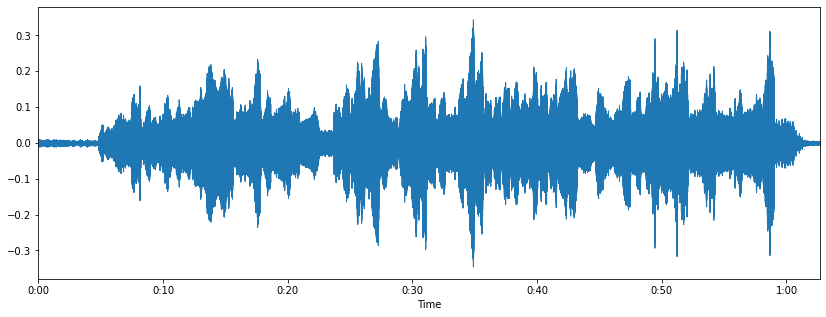

In [7]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(signal, sr=sr)

## Trying out spectrograms. Not sure which one to use yet

### Simple STFT

/home/camel/Documents/Honors Thesis Research/Audio-to-audio-alignment-research/env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


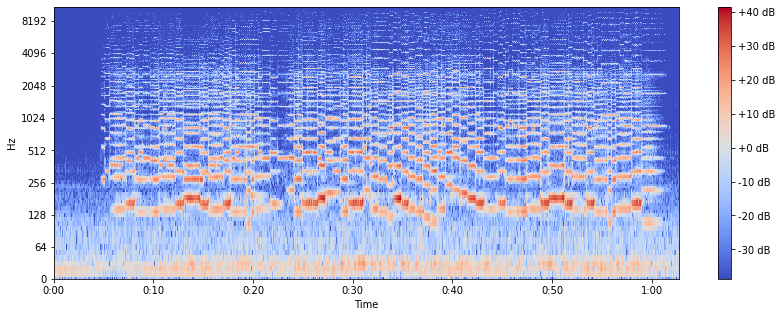

In [19]:
hop_length = 512
n_fft = 2048
X = librosa.stft(signal,n_fft=n_fft,hop_length=hop_length)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis="time", y_axis="log")
plt.colorbar(format="%+2.0f dB")

### Mel Spectrogram STFT

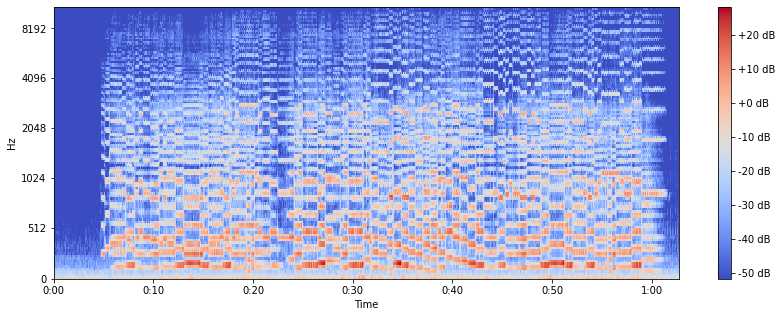

In [20]:
hop_length = 512
n_fft = 2048
X = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length)
Xdb = librosa.power_to_db(abs(X))
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB")

### Constant Q spectra STFT

/home/camel/Documents/Honors Thesis Research/Audio-to-audio-alignment-research/env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


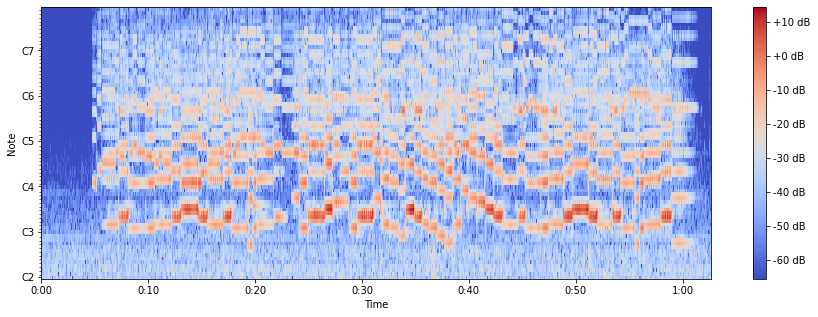

In [8]:
fmin = librosa.midi_to_hz(36)
C = librosa.cqt(signal, sr=sr, fmin=fmin, n_bins=72)
logC = librosa.amplitude_to_db(abs(C))
plt.figure(figsize=(15, 5))
librosa.display.specshow(logC, sr=sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')
plt.colorbar(format='%+2.0f dB')

## Trying Widmer's spectrogram setting

### Mel spectrogram on the audio mix

/home/camel/Documents/Honors Thesis Research/Audio-to-audio-alignment-research/env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/camel/Documents/Honors Thesis Research/Audio-to-audio-alignment-research/env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


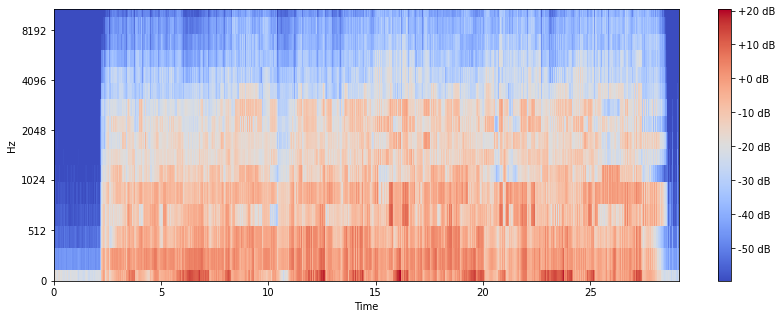

In [47]:
n_fft = 2048
sr = 22050
hop_length = sr // 20
n_mels = 16
X_audio = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
Xdb_audio = librosa.power_to_db(abs(X_audio))
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb_audio, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB")


### Processing the midi file for the audio mix

In [42]:
midi_filename = "URMP/01_Jupiter_vn_vc/Sco_01_Jupiter_vn_vc.mid"
midi_object =  pretty_midi.PrettyMIDI(midi_filename)
X_midi_raw = midi_object.synthesize()
print(X_midi_raw.shape)

(2002140,)


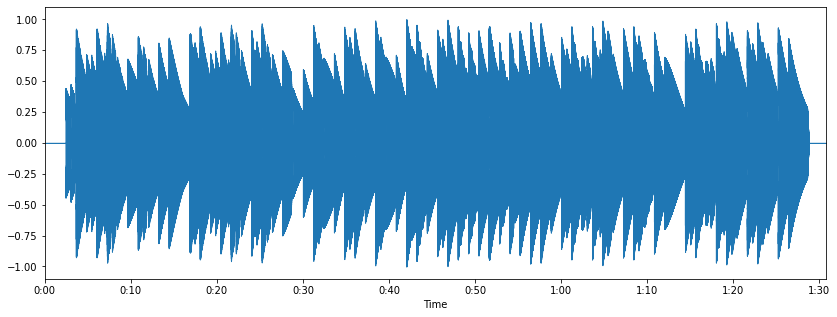

In [24]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(X_midi)

### Playing the midi file

In [44]:
ipd.Audio(X_midi_raw, rate=sr) # load a NumPy array


### Playing the mel spectrogram of the audio signal

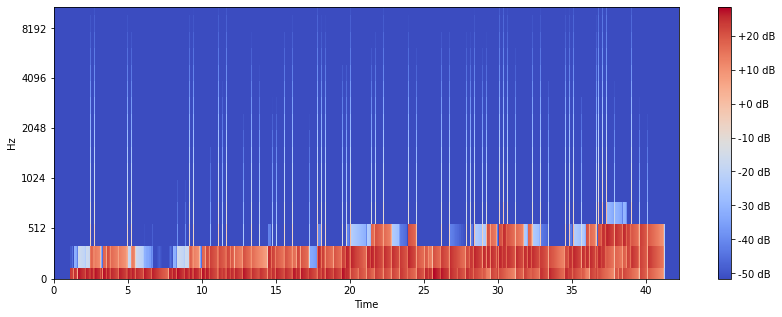

In [48]:
n_fft = 2048
sr = 22050
hop_length = sr // 20
n_mels = 16
X_midi = librosa.feature.melspectrogram(X_midi_raw, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
Xdb_midi = librosa.power_to_db(abs(X_midi))
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb_midi, sr=sr, x_axis="time", y_axis="mel")
plt.colorbar(format="%+2.0f dB")

### Applying DTW on audio and midi signal

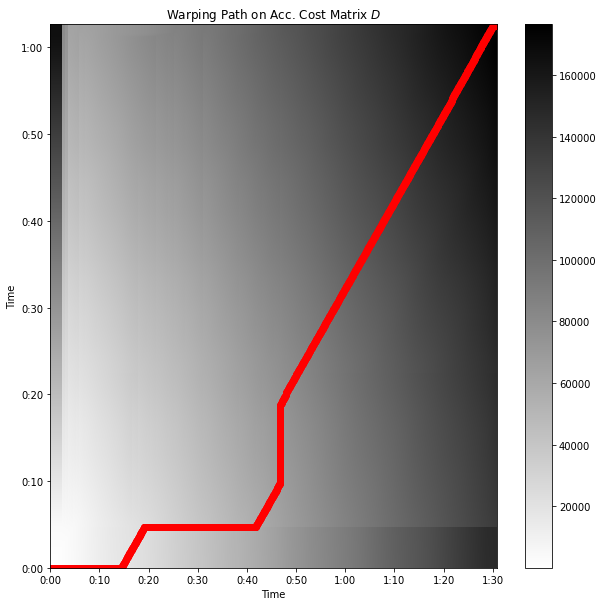

In [50]:
D, wp = librosa.sequence.dtw(X=Xdb_audio, Y=Xdb_midi, metric='euclidean')
wp_s = np.asarray(wp) * hop_length / sr

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
librosa.display.specshow(D, x_axis='time', y_axis='time',
                         cmap='gray_r', hop_length=hop_length)
imax = ax.imshow(D, cmap=plt.get_cmap('gray_r'),
                 origin='lower', interpolation='nearest', aspect='auto')
ax.plot(wp_s[:, 1], wp_s[:, 0], marker='o', color='r')
plt.title('Warping Path on Acc. Cost Matrix $D$')
plt.colorbar()